In [ ]:
import os
import numpy as np
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
!pip install segmentation_models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.8 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

class CustomDataGenerator(Sequence):
    def __init__(self, image_dir, mask_dir=None, batch_size=32, target_size=(256, 256), shuffle=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle = shuffle
        self.image_filenames = os.listdir(image_dir)

        if mask_dir:
            self.mask_filenames = os.listdir(mask_dir)
            assert len(self.image_filenames) == len(self.mask_filenames), "Number of images and masks must match."
        else:
            self.mask_filenames = None

        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_filenames) / self.batch_size))

    def __getitem__(self, index):
        if index >= len(self):
            raise IndexError('DataGenerator object is out of range')
        batch_images = self.image_filenames[index * self.batch_size:(index + 1) * self.batch_size]
        return self.__data_generation(batch_images)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.image_filenames)

    def __data_generation(self, batch_images):
        X = np.empty((self.batch_size, *self.target_size, 3))  # Satellite images with 3 channels (RGB)
        if self.mask_dir:
            y = np.empty((self.batch_size, *self.target_size, 1))  # Masks converted to 1 channel
        else:
            y = None

        for i, image_name in enumerate(batch_images):
            # Load and preprocess satellite image (RGB)
            img_path = os.path.join(self.image_dir, image_name)
            image = load_img(img_path, target_size=self.target_size)  # Default is RGB
            X[i,] = img_to_array(image) / 255.0  # Normalize to [0, 1]

            # Load and preprocess mask image (convert RGB to grayscale)
            if self.mask_dir:
                mask_name = image_name.replace('_sat.jpg', '_mask.png')
                mask_path = os.path.join(self.mask_dir, mask_name)
                mask = load_img(mask_path, target_size=self.target_size, color_mode='grayscale')  # Load mask as grayscale
                y[i,] = img_to_array(mask) / 255.0

        return X, y

In [ ]:
train_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/train_resize/satellite_resize',
    mask_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/train_resize/mask_resize',
    batch_size=32,
    target_size=(256, 256),
    shuffle=True
)

val_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/validation_resize/validation_satellite_resize',
    mask_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/validation_resize/validation_mask_resize',
    batch_size=32,
    target_size=(256, 256),
    shuffle=False
)

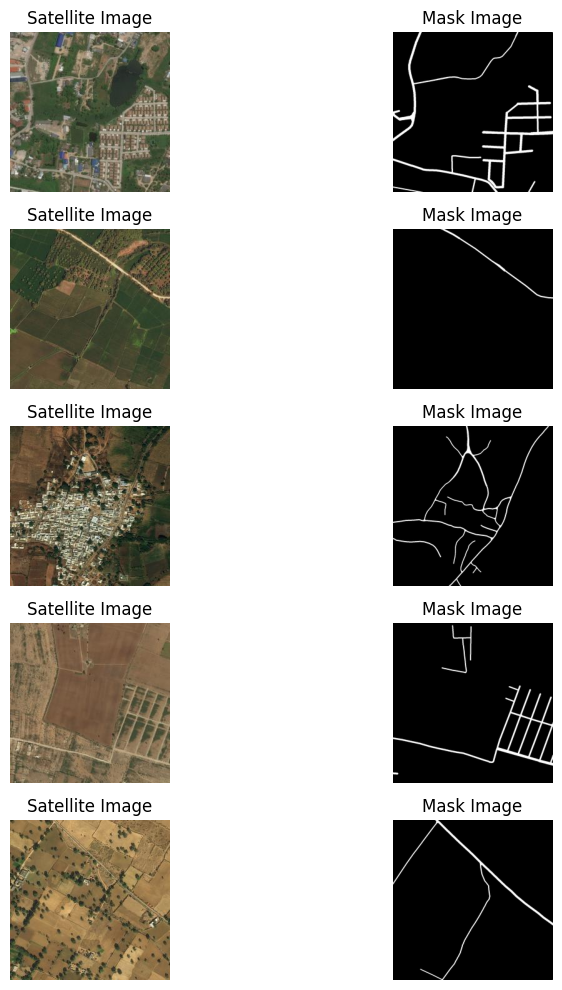

In [ ]:
import matplotlib.pyplot as plt

satellite_images, masks = train_gen[0]  # Get first bactch

num_images = 5

fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 2))

for i in range(num_images):
    # Display satellite image
    axes[i, 0].imshow(satellite_images[i])
    axes[i, 0].set_title('Satellite Image')
    axes[i, 0].axis('off')

    # Display mask image
    axes[i, 1].imshow(masks[i].squeeze(), cmap='gray')  # Squeeze to remove single-dimensional entries
    axes[i, 1].set_title('Mask Image')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
total_batches = len(train_gen)
print(f"Total batches in train_gen: {total_batches}")

Total batches in train_gen: 175


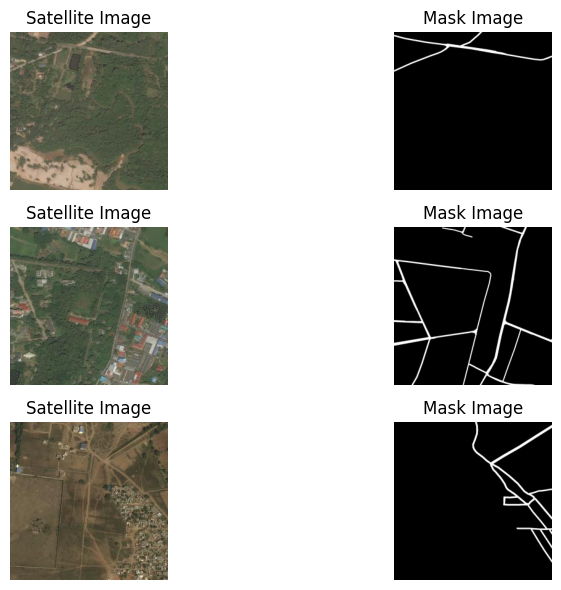

In [ ]:
import matplotlib.pyplot as plt

satellite_images, masks = val_gen[0]  # Get the first batch

num_images = 3

fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 2))

for i in range(num_images):
    axes[i, 0].imshow(satellite_images[i])
    axes[i, 0].set_title('Satellite Image')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(masks[i].squeeze(), cmap='gray')  # Squeeze to remove single-dimensional entries
    axes[i, 1].set_title('Mask Image')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
total_batches = len(val_gen)
print(f"Total batches in val_gen: {total_batches}")

Total batches in val_gen: 19


In [ ]:
import os
import shutil
import random

def create_test_dataset(source_image_dir, dest_image_dir, num_images=100):
    """
    Creates a test dataset by randomly selecting images from the train dataset.
    Only copies satellite images, excluding masks.

    Args:
        source_image_dir: Path to the source directory containing training images.
        dest_image_dir: Path to the destination directory for test images.
        num_images: Number of images to select for the test dataset.
    """
    # Create destination directory if it doesn't exist
    os.makedirs(dest_image_dir, exist_ok=True)

    # Get a list of image filenames from the source directory
    image_filenames = os.listdir(source_image_dir)

    # Randomly select a subset of images
    selected_images = random.sample(image_filenames, num_images)

    # Copy selected images to the destination directory
    for image_filename in selected_images:
        source_image_path = os.path.join(source_image_dir, image_filename)
        dest_image_path = os.path.join(dest_image_dir, image_filename)
        shutil.copy(source_image_path, dest_image_path)

# Example usage:
source_image_dir = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/train_resize/satellite_resize'
dest_image_dir = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images'

create_test_dataset(source_image_dir, dest_image_dir, num_images=100)

In [ ]:
test_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/updated-data-resized/test_resize/images',  # Specify the 'images' subdirectory
    batch_size=32,  # Or adjust the batch size
    target_size=(256, 256),
    shuffle=False
)

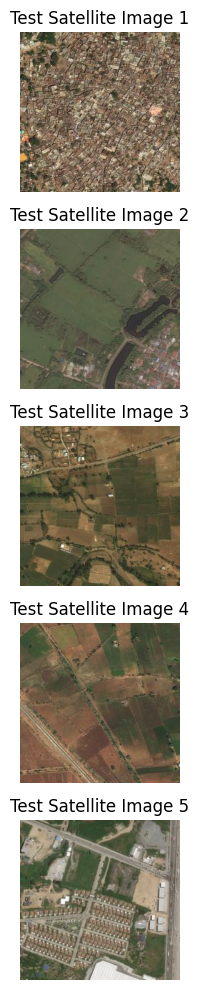

In [ ]:
import matplotlib.pyplot as plt

# Assuming test_gen yields (images, masks), you can access the images like this:
test_images, _ = test_gen[0]  # Ignore masks for visualization

num_images = 5

fig, axes = plt.subplots(num_images, 1, figsize=(10, num_images * 2))

for i in range(num_images):
    # Display satellite image
    axes[i].imshow(test_images[i])  # Access the individual image
    axes[i].set_title(f'Test Satellite Image {i + 1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras import backend as K

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Conv2D
from keras.saving import register_keras_serializable

@register_keras_serializable()
class SelfAttentionBlock(Layer):
    def __init__(self, filters, **kwargs):
        super(SelfAttentionBlock, self).__init__(**kwargs)
        self.filters = filters
        self.query_conv = Conv2D(self.filters // 8, (1, 1), padding="same")
        self.key_conv = Conv2D(self.filters // 8, (1, 1), padding="same")
        self.value_conv = Conv2D(self.filters, (1, 1), padding="same")

    def call(self, x):
        q = self.query_conv(x)
        k = self.key_conv(x)
        v = self.value_conv(x)

        q_reshaped = tf.reshape(q, [tf.shape(x)[0], -1, self.filters // 8])
        k_reshaped = tf.reshape(k, [tf.shape(x)[0], -1, self.filters // 8])
        v_reshaped = tf.reshape(v, [tf.shape(x)[0], -1, self.filters])

        attention = tf.matmul(q_reshaped, k_reshaped, transpose_b=True)
        attention = tf.nn.softmax(attention, axis=-1)
        attention_output = tf.matmul(attention, v_reshaped)
        attention_output = tf.reshape(attention_output, tf.shape(x))

        return tf.add(attention_output, x)

    def get_config(self):
        config = super(SelfAttentionBlock, self).get_config()
        config.update({"filters": self.filters})
        return config


In [ ]:
def binary_unet_with_self_attention(IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=3):
    # Input layer
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    s = inputs

    # Downsampling layers
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
    c1 = Dropout(0.2)(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1) # 128*128 now

    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.2)(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2) # 64*64 now

    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3) # 32*32 now

    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4) # 16*16 now

    # Bottleneck with self-attention
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Apply self-attention
    c5 = SelfAttentionBlock(filters=256)(c5)  # at 16*16 feature map

    # Upsampling layers
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4]) # 32*32 now
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3]) # 64*64 now
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2]) # 128*128 now
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.2)(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = concatenate([u9, c1]) # 226*256 now
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.2)(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    # Output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])

    return model

In [ ]:
# Define the model using the function you created
model = binary_unet_with_self_attention(IMG_HEIGHT=256, IMG_WIDTH=256, IMG_CHANNELS=3)

# Now you can compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

# Paths
checkpoint_pattern_path = '/content/drive/MyDrive/road-extraction-DL/updated-data/epoch_{epoch:02d}_self_attention_model.keras'
log_path = '/content/drive/MyDrive/road-extraction-DL/updated-data/training_log_unet_self_attention.csv'

# Callbacks
checkpoint_callback = ModelCheckpoint(
    checkpoint_pattern_path,
    monitor='val_loss',
    save_best_only=False,  # Save at every epoch
    mode='min',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Stop if val_loss doesn't improve for 5 epochs
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

csv_logger = CSVLogger(log_path, append=False)  # Fresh log file

# Train from scratch
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,
    callbacks=[checkpoint_callback, early_stop, reduce_lr, csv_logger],
    verbose=1
)

Epoch 1/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9148 - loss: 0.2078 

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_20']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)



Epoch 1: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_01_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1442s 29s/step - accuracy: 0.9148 - loss: 0.2075 - val_accuracy: 0.9181 - val_loss: 0.1813 - learning_rate: 0.0010
Epoch 2/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9127 - loss: 0.1712 
Epoch 2: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_02_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1397s 28s/step - accuracy: 0.9127 - loss: 0.1711 - val_accuracy: 0.9181 - val_loss: 0.2030 - learning_rate: 0.0010
Epoch 3/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9163 - loss: 0.1580 
Epoch 3: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_03_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1483s 30s/step - accuracy: 0.9163 - loss: 0.1580 - val_accuracy: 0.9181 - val_loss: 0.1746 - learning_rate: 0.0010
Epoch 4/25
25/50 ━━━━━━━━━━━━━━━━━━━━ 11:11 27s/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 4: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_04_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 782s 15s/step - accuracy: 0.9143 - loss: 0.1558 - val_accuracy: 0.9181 - val_loss: 0.1957 - learning_rate: 0.0010
Epoch 5/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9095 - loss: 0.1620 
Epoch 5: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_05_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1399s 28s/step - accuracy: 0.9096 - loss: 0.1619 - val_accuracy: 0.9181 - val_loss: 0.1757 - learning_rate: 0.0010
Epoch 6/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9125 - loss: 0.1553 
Epoch 6: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_06_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1412s 28s/step - accuracy: 0.9124 - loss: 0.1552 - val_accuracy: 0.9181 - val_loss: 0.1606 - learning_rate: 0.0010
Epoch 7/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accu

In [ ]:
from keras.models import load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger

# Import the custom SelfAttentionBlock directly from the notebook cell where it's defined
# Instead of 'from your_module import SelfAttentionBlock', use:
#from ipython_input_14_050f8cd4406c import SelfAttentionBlock  # Remove this or comment it out

# === Paths ===
resume_from_epoch = 17
model_path = f'/content/drive/MyDrive/road-extraction-DL/updated-data/epoch_{resume_from_epoch:02d}_self_attention_model.keras'
checkpoint_pattern_path = '/content/drive/MyDrive/road-extraction-DL/updated-data/epoch_{epoch:02d}_self_attention_model.keras'
log_path = '/content/drive/MyDrive/road-extraction-DL/updated-data/training_log_unet_self_attention.csv'

# === Load model from last successful checkpoint ===
# Temporarily disable mixed precision to load the model
mixed_precision.set_global_policy('float32')
model = load_model(model_path, custom_objects={"SelfAttentionBlock": SelfAttentionBlock})
# Re-enable mixed precision if desired
mixed_precision.set_global_policy('mixed_float16')

# === Callbacks ===
checkpoint_callback = ModelCheckpoint(
    checkpoint_pattern_path,
    monitor='val_loss',
    save_best_only=False,  # Save every epoch
    mode='min',
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

csv_logger = CSVLogger(log_path, append=True)  # Append to existing log

# === Resume training from epoch 18 ===
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,  # Total target epochs
    initial_epoch=resume_from_epoch,  # Resume from 18
    callbacks=[checkpoint_callback, early_stop, reduce_lr, csv_logger],
    verbose=1
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 18/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 42s/step - accuracy: 0.9144 - loss: 0.1105 
Epoch 18: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_18_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 2554s 51s/step - accuracy: 0.9144 - loss: 0.1105 - val_accuracy: 0.9195 - val_loss: 0.1013 - learning_rate: 0.0010
Epoch 19/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 30s/step - accuracy: 0.9139 - loss: 0.1120 
Epoch 19: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_19_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1560s 31s/step - accuracy: 0.9139 - loss: 0.1120 - val_accuracy: 0.9194 - val_loss: 0.0997 - learning_rate: 0.0010
Epoch 20/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.9161 - loss: 0.1060 
Epoch 20: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_20_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1100s 22s/step - accuracy: 0.9161 - loss: 0.1060 - val_accuracy: 0.9196 - val_lo

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 21: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_21_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 568s 11s/step - accuracy: 0.9155 - loss: 0.1063 - val_accuracy: 0.9198 - val_loss: 0.0973 - learning_rate: 0.0010
Epoch 22/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.9189 - loss: 0.0997 
Epoch 22: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_22_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1161s 23s/step - accuracy: 0.9189 - loss: 0.0997 - val_accuracy: 0.9204 - val_loss: 0.0941 - learning_rate: 0.0010
Epoch 23/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step - accuracy: 0.9147 - loss: 0.1044 
Epoch 23: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_23_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1099s 22s/step - accuracy: 0.9147 - loss: 0.1044 - val_accuracy: 0.9198 - val_loss: 0.0949 - learning_rate: 0.0010
Epoch 24/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 21s/step 

In [ ]:
#### Old function ####
history = model.fit(
    train_gen,
    steps_per_epoch=50,
    validation_data=val_gen,
    validation_steps=10,
    epochs=25,
    verbose=1,
    callbacks=[checkpoint_callback]
)

Epoch 1/8
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.8399 - loss: 0.3663 
Epoch 1: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_01_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1561s 31s/step - accuracy: 0.8410 - loss: 0.3642 - val_accuracy: 0.9139 - val_loss: 0.2026
Epoch 2/8
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9122 - loss: 0.1971 
Epoch 2: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_02_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1444s 29s/step - accuracy: 0.9122 - loss: 0.1968 - val_accuracy: 0.9180 - val_loss: 0.1565
Epoch 3/8
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9074 - loss: 0.1767 
Epoch 3: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_03_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1461s 29s/step - accuracy: 0.9074 - loss: 0.1766 - val_accuracy: 0.9141 - val_loss: 0.1879
Epoch 4/8
25/50 ━━━━━━━━━━━━━━━━━━━━ 10:59 26s

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 4: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_04_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 738s 14s/step - accuracy: 0.9124 - loss: 0.1622 - val_accuracy: 0.9162 - val_loss: 0.2014
Epoch 5/8
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.9170 - loss: 0.1523 
Epoch 5: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_05_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1386s 28s/step - accuracy: 0.9170 - loss: 0.1524 - val_accuracy: 0.9193 - val_loss: 0.1550
Epoch 6/8
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9126 - loss: 0.1547 
Epoch 6: saving model to /content/drive/MyDrive/road-extraction-DL/updated-data/epoch_06_self_attention_model.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 1398s 28s/step - accuracy: 0.9126 - loss: 0.1547 - val_accuracy: 0.9145 - val_loss: 0.1575
Epoch 7/8
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.9132 - loss: 0.1489 
Epoch 7: saving model to /content/drive/MyDriv

In [ ]:
model.save('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/u_netself_attention-25.keras')

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras import mixed_precision

# Temporarily disable mixed precision to load the model
mixed_precision.set_global_policy('float32')
model = load_model('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/u_netself_attention-25.keras', custom_objects={"SelfAttentionBlock": SelfAttentionBlock})
# Re-enable mixed precision if desired
mixed_precision.set_global_policy('mixed_float16')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'self_attention_block', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


In [ ]:
#### FOR TEST GEN ONLY ####
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import os

class CustomDataGenerator(Sequence):
    def __init__(self, image_dir, mask_dir=None, batch_size=32, target_size=(256, 256), shuffle=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.batch_size = batch_size
        self.target_size = target_size
        self.shuffle = shuffle
        self.image_filenames = os.listdir(image_dir)

        if mask_dir:
            self.mask_filenames = os.listdir(mask_dir)
            assert len(self.image_filenames) == len(self.mask_filenames), "Number of images and masks must match."
        else:
            self.mask_filenames = None

        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.image_filenames) / self.batch_size))

    def __getitem__(self, index):
        if index >= len(self):
            raise IndexError('DataGenerator object is out of range')
        batch_images = self.image_filenames[index * self.batch_size:(index + 1) * self.batch_size]
        return self.__data_generation(batch_images)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.image_filenames)

    def __data_generation(self, batch_images):
        X = np.empty((self.batch_size, *self.target_size, 3))  # Satellite images with 3 channels (RGB)

        # Initialize y even if mask_dir is None
        y = np.empty((self.batch_size, *self.target_size, 1))

        for i, image_name in enumerate(batch_images):
            # Load and preprocess satellite image (RGB)
            img_path = os.path.join(self.image_dir, image_name)
            image = load_img(img_path, target_size=self.target_size)  # Default is RGB
            X[i,] = img_to_array(image) / 255.0  # Normalize to [0, 1]

            # Load and preprocess mask image (convert RGB to grayscale)
            if self.mask_dir:
                mask_name = image_name.replace('_sat.jpg', '_mask.png')
                mask_path = os.path.join(self.mask_dir, mask_name)
                mask = load_img(mask_path, target_size=self.target_size, color_mode='grayscale')  # Load mask as grayscale
                y[i,] = img_to_array(mask) / 255.0
            #else:
                # You can fill y with dummy data if needed
                #y[i,] = np.zeros((*self.target_size, 1))  # Example: Fill with zeros


        return X, y

In [ ]:
test_gen = CustomDataGenerator(
    image_dir='/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images',
    mask_dir=None,  # Masks are not needed for testing
    batch_size=1,
    target_size=(256, 256),
    shuffle=False
)

In [ ]:
predictions = model.predict(test_gen)

569/569 ━━━━━━━━━━━━━━━━━━━━ 98s 172ms/step


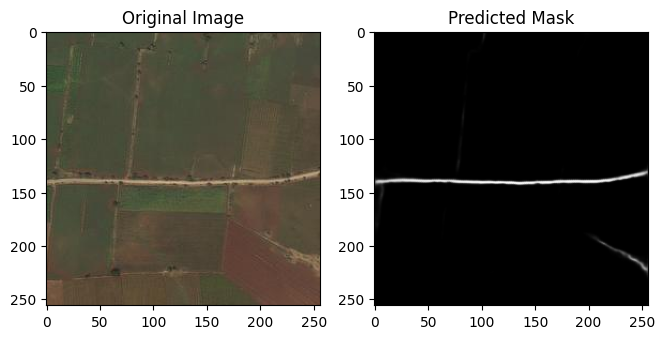

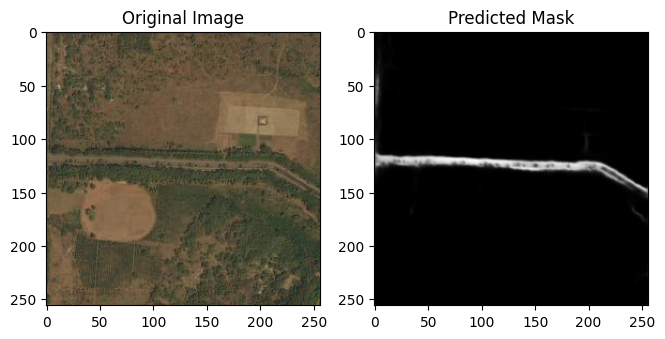

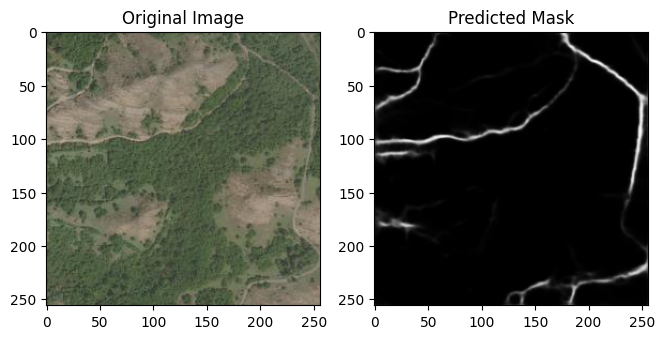

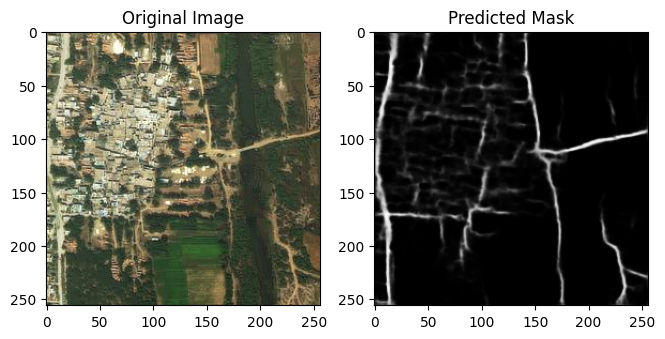

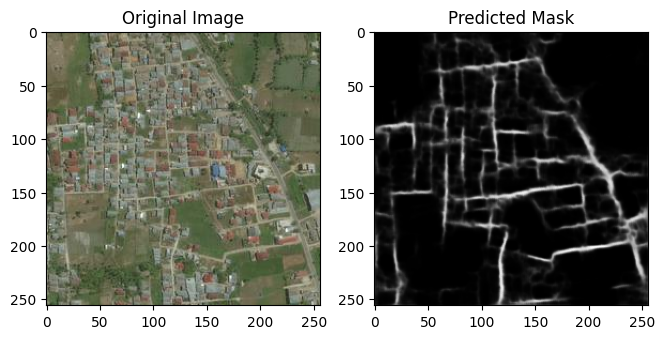

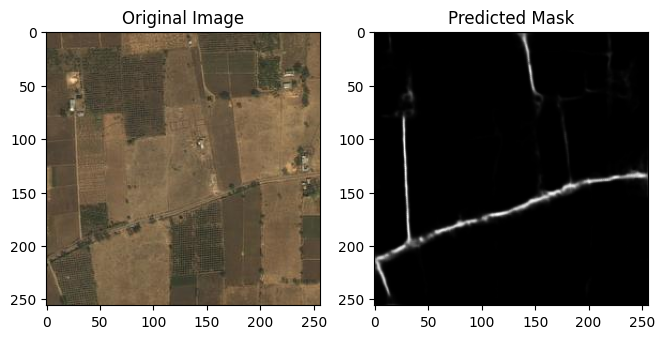

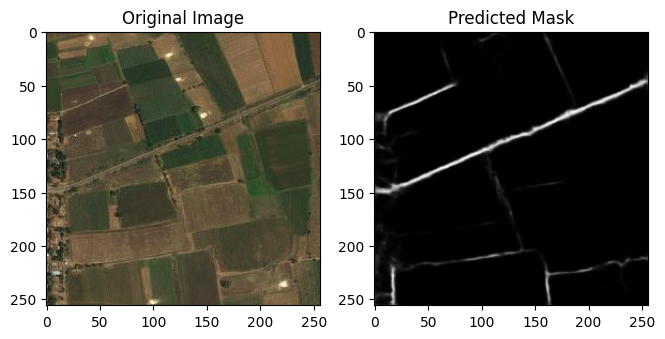

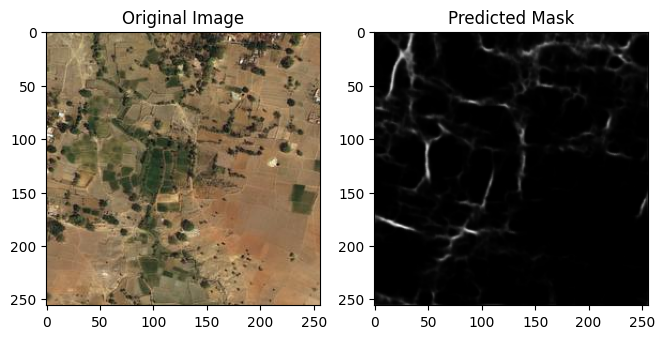

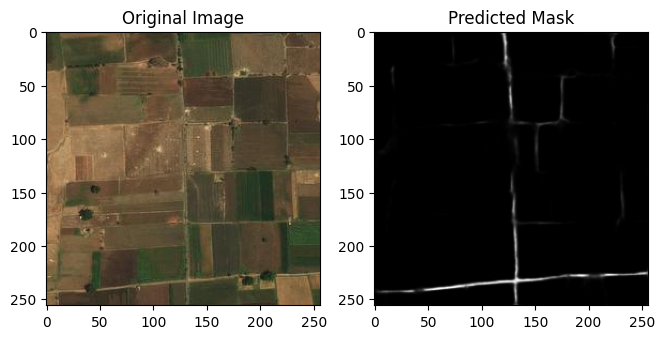

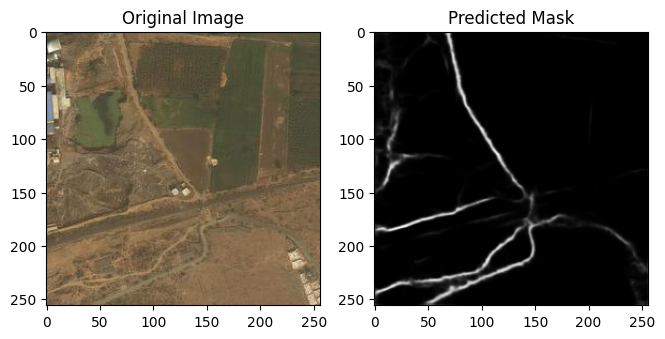

In [ ]:
#### At 25 epochs ####
import matplotlib.pyplot as plt
import numpy as np

# Visualize some predictions
num_images_to_show = 10  # Adjust as needed

for i in range(num_images_to_show):
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(test_gen[i][0][0])  # Get the first test image
    plt.title('Original Image')

    # Predicted Mask
    plt.subplot(1, 3, 2)
    plt.imshow(predictions[i].squeeze(), cmap='gray')  # Squeeze to remove channels if needed
    plt.title('Predicted Mask')

    plt.show()

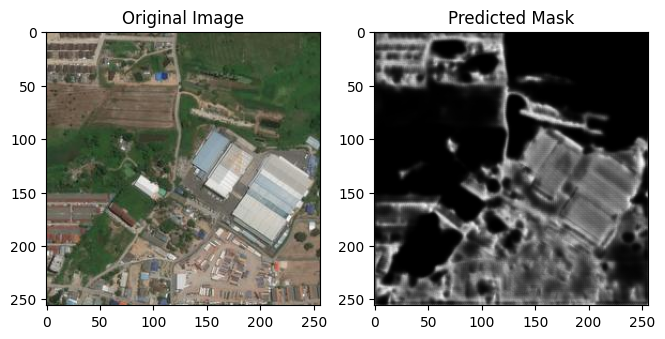

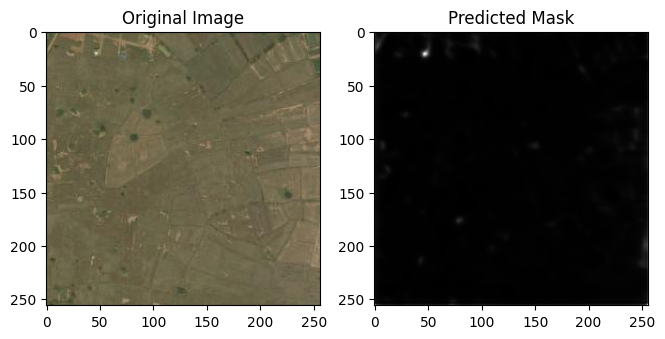

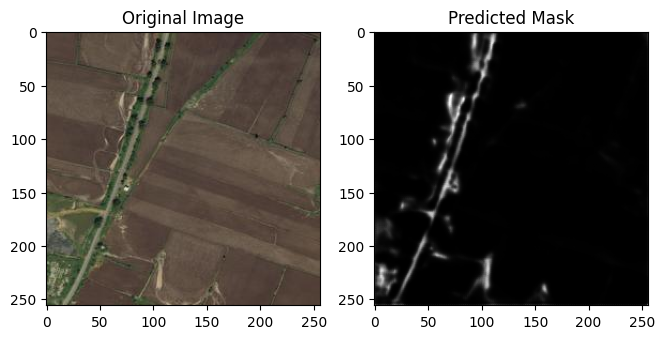

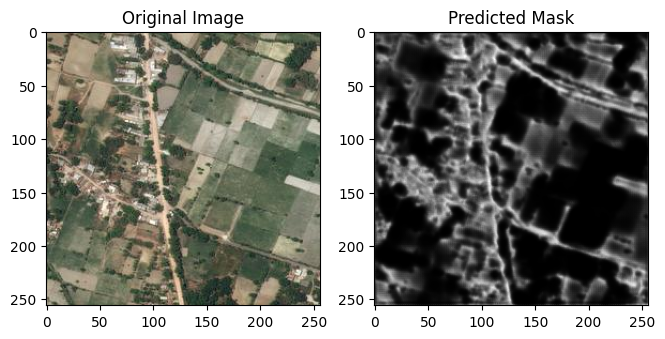

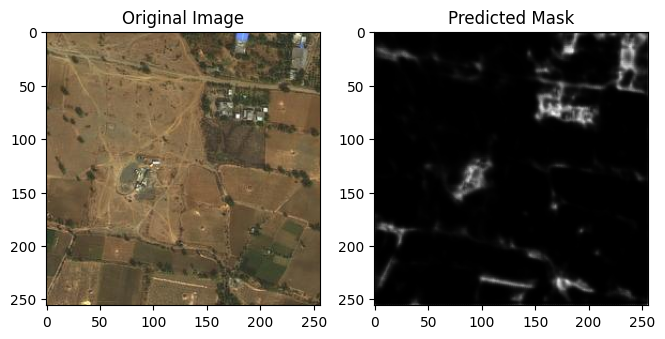

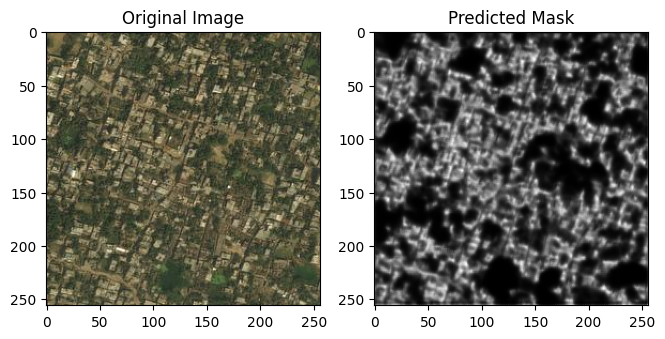

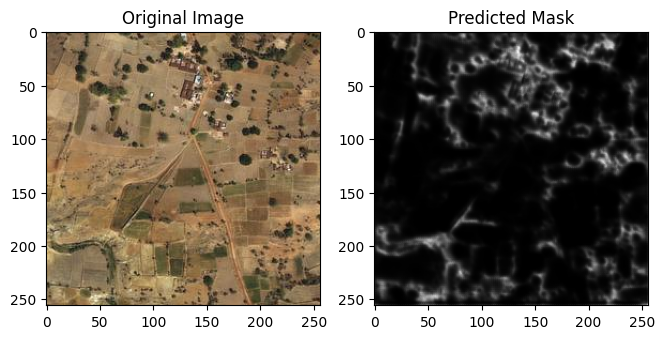

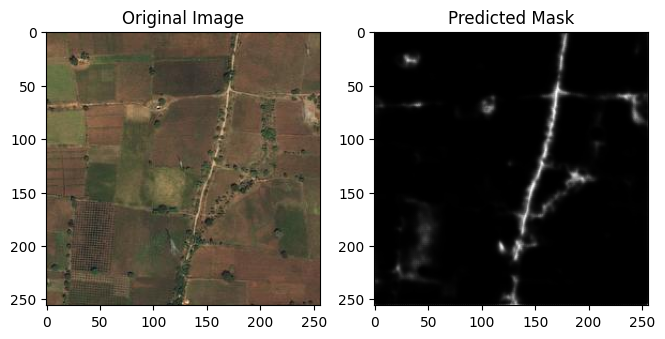

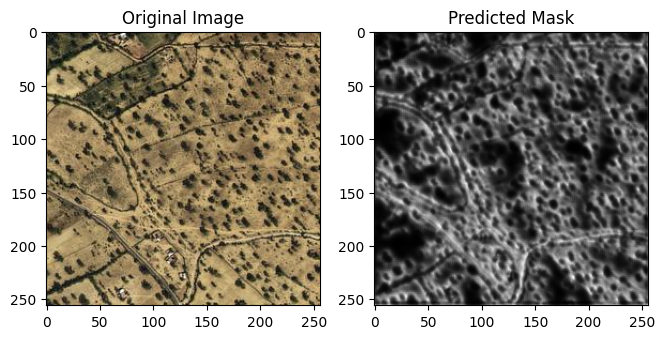

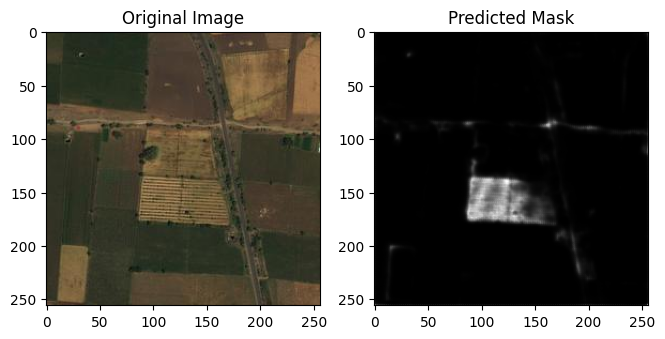

In [ ]:
###### AT 8 epochs ######
import matplotlib.pyplot as plt
import numpy as np

# Visualize some predictions
num_images_to_show = 10  # Adjust as needed

for i in range(num_images_to_show):
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(test_gen[i][0][0])  # Get the first test image
    plt.title('Original Image')

    # Predicted Mask
    plt.subplot(1, 3, 2)
    plt.imshow(predictions[i].squeeze(), cmap='gray')  # Squeeze to remove channels if needed
    plt.title('Predicted Mask')

    plt.show()

In [ ]:
#### Testing on random images ######
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the path to your resized test images
test_images_path = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images'

# Get a list of all image filenames
image_filenames = os.listdir(test_images_path)

# Randomly select a subset of images for testing
num_samples = 5  # Specify the number of images to test
sample_filenames = random.sample(image_filenames, num_samples)

# Load and preprocess images
test_images = []
for filename in sample_filenames:
    image_path = os.path.join(test_images_path, filename)
    image = Image.open(image_path).convert('RGB')
    image = image.resize((256, 256))  # Resize to match model input
    image_array = np.array(image) / 255.0  # Normalize pixel values
    test_images.append(image_array)

test_images = np.array(test_images)


In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras import mixed_precision

# Temporarily disable mixed precision to load the model
mixed_precision.set_global_policy('float32')
model = load_model('/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/u_netself_attention-25.keras', custom_objects={"SelfAttentionBlock": SelfAttentionBlock})
# Re-enable mixed precision if desired
mixed_precision.set_global_policy('mixed_float16')

/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'self_attention_block', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


In [ ]:
# Predict segmentation masks for the test images
predicted_masks = model.predict(test_images)

# Threshold the predicted masks to obtain binary masks
binary_masks = (predicted_masks > 0.15).astype(np.uint8)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


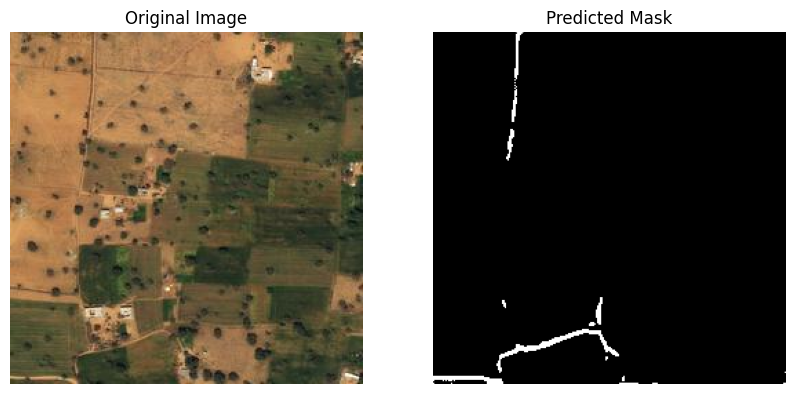

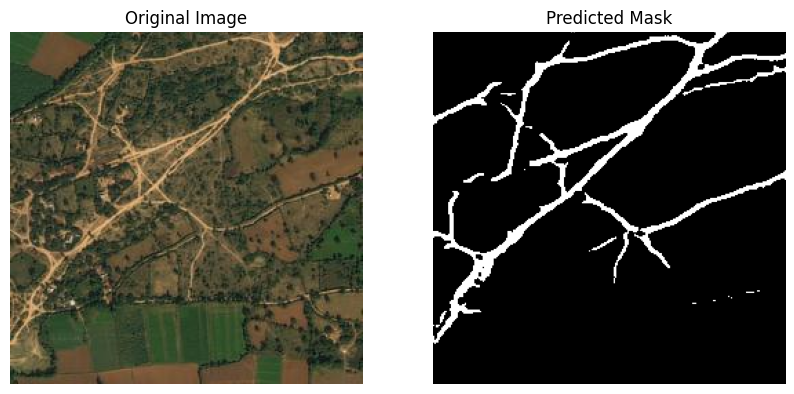

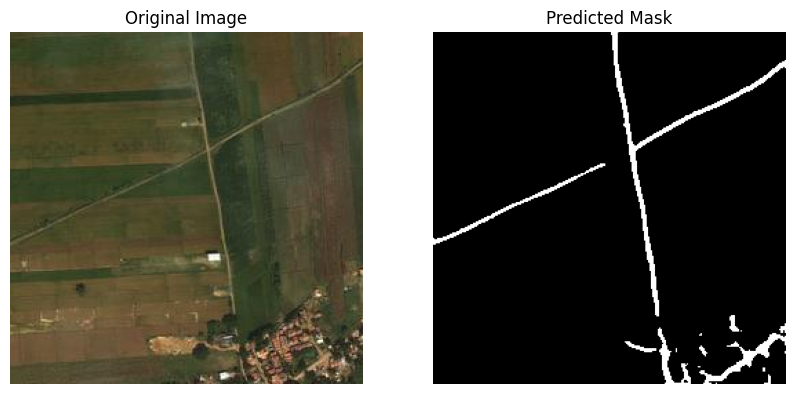

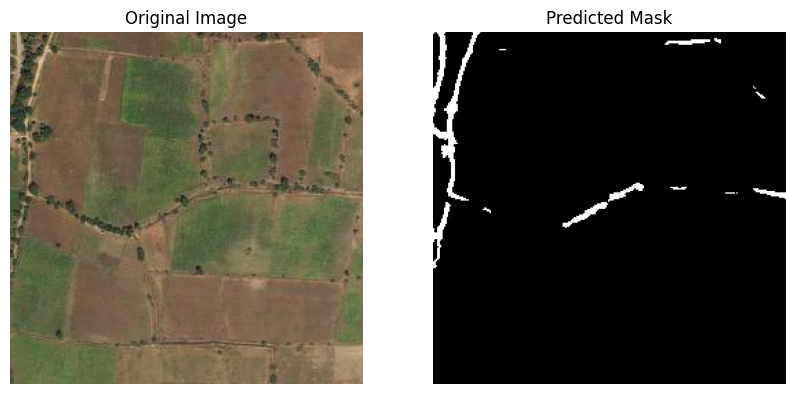

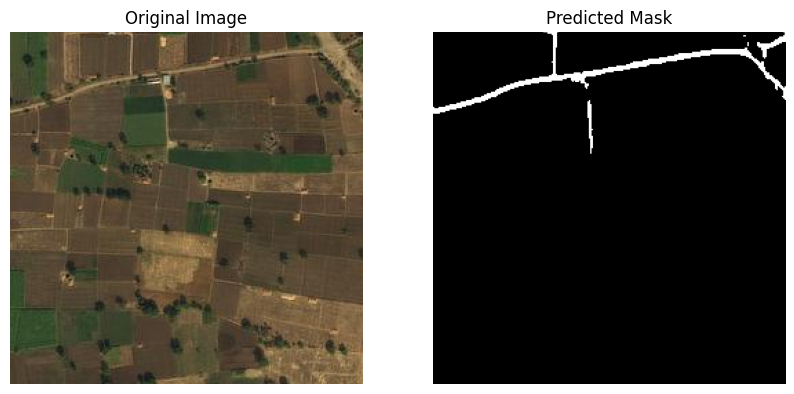

In [ ]:
# Visualize the original images and their corresponding predicted masks
for i in range(num_samples):
    plt.figure(figsize=(10, 5))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(test_images[i])
    plt.title('Original Image')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(1, 2, 2)
    plt.imshow(binary_masks[i].squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


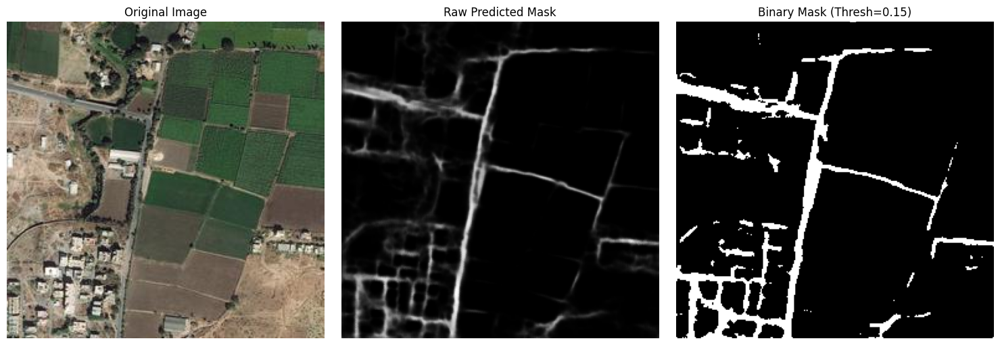

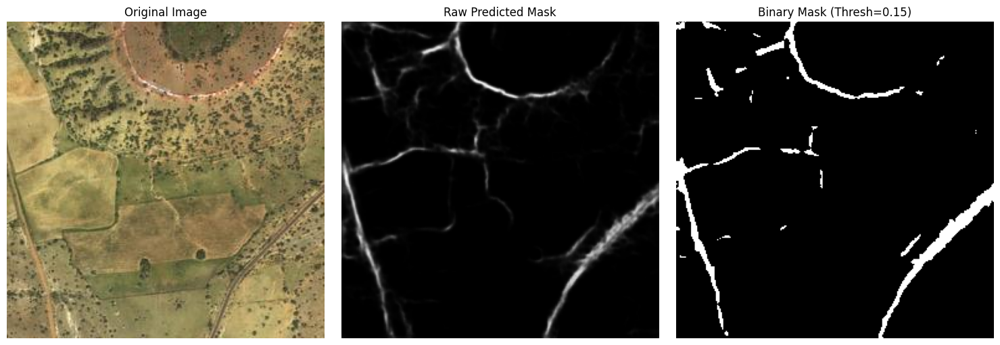

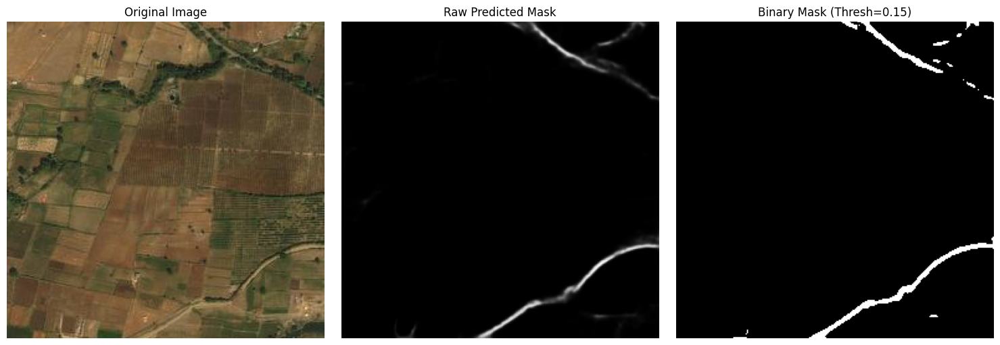

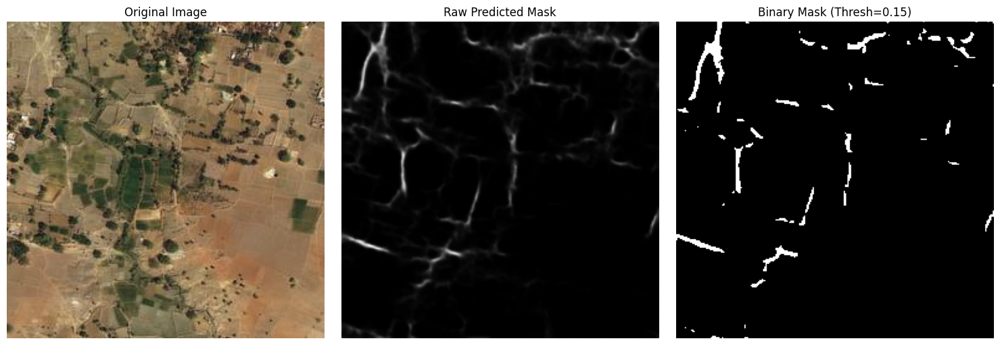

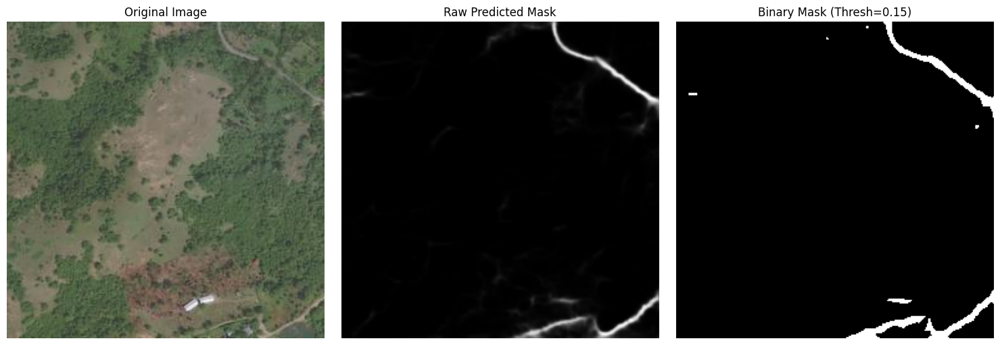

In [ ]:
#### Testing and predicting ####
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# === Settings ===
test_images_path = '/content/drive/MyDrive/deepglobe_dataset/full/updated-data-resized/test_resize/images'
num_images_to_show = 5  # Adjust as needed
threshold = 0.15        # Prediction threshold

# === Load and preprocess random test images ===
image_filenames = [f for f in os.listdir(test_images_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
sample_filenames = random.sample(image_filenames, num_images_to_show)

test_images = []
original_images = []

for filename in sample_filenames:
    image_path = os.path.join(test_images_path, filename)
    image = Image.open(image_path).convert('RGB')
    image = image.resize((256, 256))                    # Match model input
    original_images.append(np.array(image))             # Save for later display
    image_array = np.array(image) / 255.0               # Normalize
    test_images.append(image_array)

test_images = np.array(test_images)                     # Shape: (N, 256, 256, 3)

# === Make predictions ===
predicted_masks = model.predict(test_images)
binary_masks = (predicted_masks > threshold).astype(np.uint8)

# === Visualize predictions ===
for i in range(num_images_to_show):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    # Raw Predicted Mask (heatmap)
    plt.subplot(1, 3, 2)
    plt.imshow(predicted_masks[i].squeeze(), cmap='gray')
    plt.title('Raw Predicted Mask')
    plt.axis('off')

    # Thresholded Binary Mask
    plt.subplot(1, 3, 3)
    plt.imshow(binary_masks[i].squeeze(), cmap='gray')
    plt.title(f'Binary Mask (Thresh={threshold})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
history_dict = {
    'accuracy':     [0.8410, 0.9122, 0.9074, 0.9124, 0.9170, 0.9126, 0.9132, 0.9113],
    'val_accuracy': [0.9139, 0.9180, 0.9141, 0.9162, 0.9193, 0.9145, 0.9163, 0.9169],
    'loss':         [0.3642, 0.1968, 0.1766, 0.1622, 0.1524, 0.1547, 0.1488, 0.1531],
    'val_loss':     [0.2026, 0.1565, 0.1879, 0.2014, 0.1550, 0.1575, 0.1564, 0.1554]
}


In [ ]:
import matplotlib.pyplot as plt

def plot_saved_history(history_dict, model_name='Model'):
    acc = history_dict['accuracy']
    val_acc = history_dict['val_accuracy']
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r^-', label='Validation Accuracy')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training Loss')
    plt.plot(epochs, val_loss, 'r^-', label='Validation Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()
